In [1]:
import sys
import regions
import pyavm
import numpy as np
import PIL
import time

from astropy.io import fits
from astropy.wcs import WCS
from astropy.wcs.utils import proj_plane_pixel_scales
from astropy.visualization import simple_norm
from astropy.modeling.fitting import LevMarLSQFitter

import reproject 
from reproject.mosaicking import find_optimal_celestial_wcs, reproject_and_coadd
import matplotlib.pyplot as plt
from matplotlib.colors import rgb_to_hsv, hsv_to_rgb

from astropy.table import Table, Column, MaskedColumn
from astropy import table
from astropy.nddata import Cutout2D
from astropy.coordinates import SkyCoord
from astropy import units as u

from reproject import reproject_interp

from spectral_cube import SpectralCube
from spectral_cube import Projection

from photutils.background import MMMBackground, MADStdBackgroundRMS, Background2D
from photutils import background

import regions
import cv2

import warnings

from astropy.visualization.wcsaxes import add_scalebar
from astropy.visualization.wcsaxes import add_beam
from astroquery.svo_fps import SvoFps


from crowdsource import crowdsource_base
from crowdsource.crowdsource_base import fit_im, psfmod
from webbpsf.utils import to_griddedpsfmodel


**WARNING**: LOCAL JWST PRD VERSION PRDOPSSOC-062 CANNOT BE CHECKED AGAINST ONLINE VERSION


# Helper Functions

In [2]:
cd /orange/adamginsburg/jwst/cloudc/cloudc-jwst-2221/analysis/

/blue/adamginsburg/adamginsburg/jwst/cloudc/code/brick-jwst-2221/analysis


In [3]:
def get_cutout(filename, position, l, w, format='fits'):
    if format == 'fits':
        try: 
            hdu = fits.open(filename)
            data = np.squeeze(hdu['SCI'].data)
            head = hdu['SCI'].header
        except: 
            hdu = fits.open(filename)[0]
            data = np.squeeze(hdu.data)
            head = hdu.header
    elif format == 'casa':
        hdu = SpectralCube.read(filename, format='casa').hdu
        data = np.squeeze(hdu.data)
        head = hdu.header
    #pixel_scale = head['PIXSCALE']*u.arcsec/u.pix
    ww = WCS(head).celestial
    size = (l, w)
    #((l/pixel_scale).to(u.pix), (w/pixel_scale).to(u.pix))
    cutout = Cutout2D(data, position=position, size=size, wcs=ww)
    return cutout

def get_cutout_405(position, l, w):
    fn = '/orange/adamginsburg/jwst/cloudc/images/F405_reproj_merged-fortricolor.fits'
    return get_cutout(fn, position, l, w)
    
def get_cutout_410(position, l, w):
    fn = '/orange/adamginsburg/jwst/cloudc/images/F410_reproj_merged-fortricolor.fits'
    return get_cutout(fn, position, l, w)

def get_cutout_466(position, l, w):
    fn = '/orange/adamginsburg/jwst/cloudc/images/F466_reproj_merged-fortricolor.fits'
    return get_cutout(fn, position, l, w)

def get_cutout_187(position, l, w):
    fn = '/orange/adamginsburg/jwst/cloudc/images/F187_reproj_merged-fortricolor.fits'
    return get_cutout(fn, position, l, w)
    
def get_cutout_182(position, l, w):
    fn = '/orange/adamginsburg/jwst/cloudc/images/F182_reproj_merged-fortricolor.fits'
    return get_cutout(fn, position, l, w)

def get_cutout_212(position, l, w):
    fn = '/orange/adamginsburg/jwst/cloudc/images/F212_reproj_merged-fortricolor.fits'
    return get_cutout(fn, position, l, w)

# Catalog Prep

In [4]:
#position = SkyCoord('17:46:21.4669695284', '-28:35:38.1118497742', unit=(u.hourangle, u.deg))
position = SkyCoord('17:46:20.2483656082', '-28:33:11.4297145997', unit=(u.hourangle, u.deg))

In [5]:
basepath = '/orange/adamginsburg/jwst/cloudc/'

In [6]:
basetable_k = Table.read(f'{basepath}/catalogs/crowdsource_nsky0_merged_photometry_tables_merged.fits')

In [7]:
len(basetable)

NameError: name 'basetable' is not defined

In [ ]:
np.sum(sat_neat)

In [ ]:
short_near = np.logical_or(basetable['near_saturated_f182m_f182m'], basetable['near_saturated_f187n_f187n'], basetable['near_saturated_f212n_f212n'])
longg_near = np.logical_or(basetable['near_saturated_f410m_f410m'], basetable['near_saturated_f405n_f405n'], basetable['near_saturated_f466n_f466n'])
sat_neat = np.logical_or(short_near, longg_near)

In [19]:
l = 5 * u.arcsec
w = 5 * u.arcsec
reg_cloudc = regions.RectangleSkyRegion(center=position, width=l-0.1*u.arcsec, height=w-0.1*u.arcsec)

In [20]:
cutout_405 = get_cutout_405(position, l, w)
cutout_410 = get_cutout_410(position, l, w)
cutout_466 = get_cutout_466(position, l, w)
cutout_187 = get_cutout_187(position, l, w)
cutout_182 = get_cutout_182(position, l, w)
cutout_212 = get_cutout_212(position, l, w)

In [21]:
cat_405 = Table.read('/orange/adamginsburg/jwst/cloudc/F405N/f405n_merged_crowdsource_nsky0.fits')
cat_410 = Table.read('/orange/adamginsburg/jwst/cloudc/F410M/f410m_merged_crowdsource_nsky0.fits')
cat_466 = Table.read('/orange/adamginsburg/jwst/cloudc/F466N/f466n_merged_crowdsource_nsky0.fits')
cat_187 = Table.read('/orange/adamginsburg/jwst/cloudc/F187N/f187n_merged_crowdsource_nsky0.fits')
cat_182 = Table.read('/orange/adamginsburg/jwst/cloudc/F182M/f182m_merged_crowdsource_nsky0.fits')
cat_212 = Table.read('/orange/adamginsburg/jwst/cloudc/F212N/f212n_merged_crowdsource_nsky0.fits')

In [22]:
crds_405 = cat_405['skycoord']
crds_410 = cat_410['skycoord']
crds_466 = cat_466['skycoord']
crds_187 = cat_187['skycoord']
crds_182 = cat_182['skycoord']
crds_212 = cat_212['skycoord']

In [23]:
crds_in_405 = crds_405[reg_cloudc.contains(crds_405, wcs=cutout_405.wcs)]
crds_in_410 = crds_410[reg_cloudc.contains(crds_410, wcs=cutout_410.wcs)]
crds_in_466 = crds_466[reg_cloudc.contains(crds_466, wcs=cutout_466.wcs)]
crds_in_187 = crds_187[reg_cloudc.contains(crds_187, wcs=cutout_187.wcs)]
crds_in_182 = crds_182[reg_cloudc.contains(crds_182, wcs=cutout_182.wcs)]
crds_in_212 = crds_212[reg_cloudc.contains(crds_212, wcs=cutout_212.wcs)]

In [24]:
cat_in_405 = cat_405[reg_cloudc.contains(crds_405, wcs=cutout_405.wcs)]
cat_in_410 = cat_410[reg_cloudc.contains(crds_410, wcs=cutout_410.wcs)]
cat_in_466 = cat_466[reg_cloudc.contains(crds_466, wcs=cutout_466.wcs)]
cat_in_187 = cat_187[reg_cloudc.contains(crds_187, wcs=cutout_187.wcs)]
cat_in_182 = cat_182[reg_cloudc.contains(crds_182, wcs=cutout_182.wcs)]
cat_in_212 = cat_212[reg_cloudc.contains(crds_212, wcs=cutout_212.wcs)]

In [25]:
cat_in_405.meta['filter'] = 'f405n'
cat_in_410.meta['filter'] = 'f410m'
cat_in_466.meta['filter'] = 'f466n'
cat_in_187.meta['filter'] = 'f187n'
cat_in_182.meta['filter'] = 'f182m'
cat_in_212.meta['filter'] = 'f212n'

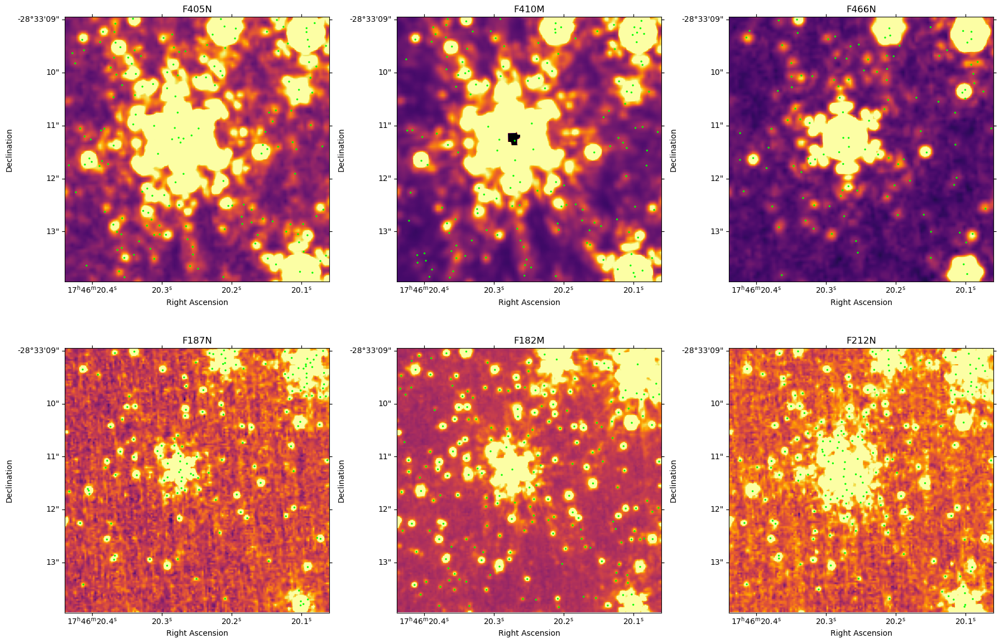

In [26]:
fig = plt.figure(figsize=(18, 12))

ax1 = plt.subplot(231, projection=cutout_405.wcs)
ax1.imshow(cutout_405.data, vmin=0, vmax=25, cmap='inferno')
ax1.scatter(crds_in_405.ra, crds_in_405.dec, edgecolor='lime', facecolor='none', transform=ax1.get_transform('world'), s=2)
ax1.set_title('F405N')
ax1.set_xlabel('Right Ascension')
ax1.set_ylabel('Declination')

ax2 = plt.subplot(232, projection=cutout_410.wcs)
ax2.imshow(cutout_410.data, vmin=0, vmax=25, cmap='inferno')
ax2.scatter(crds_in_410.ra, crds_in_410.dec, edgecolor='lime', facecolor='none', transform=ax2.get_transform('world'), s=2)
ax2.set_title('F410M')
ax2.set_xlabel('Right Ascension')
ax2.set_ylabel('Declination')

ax3 = plt.subplot(233, projection=cutout_466.wcs)
ax3.imshow(cutout_466.data, vmin=0, vmax=25, cmap='inferno')
ax3.scatter(crds_in_466.ra, crds_in_466.dec, edgecolor='lime', facecolor='none', transform=ax3.get_transform('world'), s=2)
ax3.set_title('F466N')
ax3.set_xlabel('Right Ascension')
ax3.set_ylabel('Declination')

ax4 = plt.subplot(234, projection=cutout_187.wcs)
ax4.imshow(cutout_187.data, vmin=0, vmax=25, cmap='inferno')
ax4.scatter(crds_in_187.ra, crds_in_187.dec, edgecolor='lime', facecolor='none', transform=ax4.get_transform('world'), s=2)
ax4.set_title('F187N')
ax4.set_xlabel('Right Ascension')
ax4.set_ylabel('Declination')

ax5 = plt.subplot(235, projection=cutout_182.wcs)
ax5.imshow(cutout_182.data, vmin=0, vmax=10, cmap='inferno')
ax5.scatter(crds_in_182.ra, crds_in_182.dec, edgecolor='lime', facecolor='none', transform=ax5.get_transform('world'), s=2)
ax5.set_title('F182M')
ax5.set_xlabel('Right Ascension')
ax5.set_ylabel('Declination')

ax6 = plt.subplot(236, projection=cutout_212.wcs)
ax6.imshow(cutout_212.data, vmin=0, vmax=25, cmap='inferno')
ax6.scatter(crds_in_212.ra, crds_in_212.dec, edgecolor='lime', facecolor='none', transform=ax6.get_transform('world'), s=2)
ax6.set_title('F212N')
ax6.set_xlabel('Right Ascension')
ax6.set_ylabel('Declination')

plt.tight_layout()
plt.show()

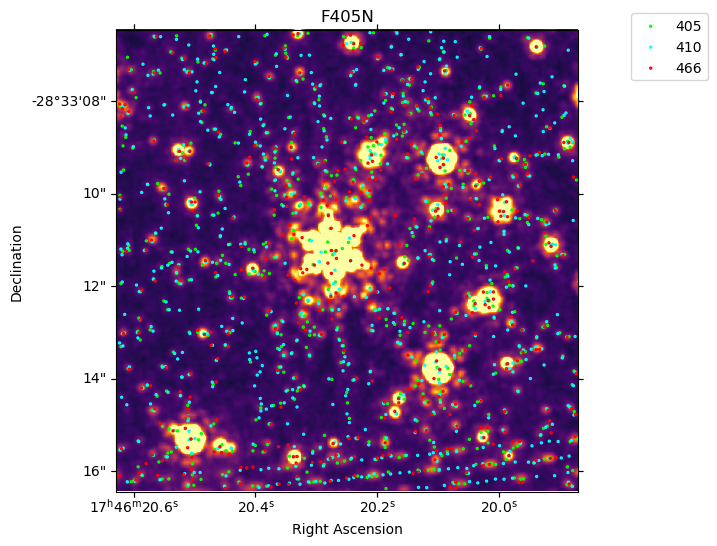

In [18]:
plt.figure(figsize=(6,6))

ax1 = plt.subplot(111, projection=cutout_405.wcs)
ax1.imshow(cutout_405.data, vmin=0, vmax=50, cmap='inferno')
ax1.scatter(crds_in_405.ra, crds_in_405.dec, edgecolor='lime', facecolor='none', transform=ax1.get_transform('world'), s=2, label='405')
ax1.scatter(crds_in_410.ra, crds_in_410.dec, edgecolor='cyan', facecolor='none', transform=ax1.get_transform('world'), s=2, label='410')
ax1.scatter(crds_in_466.ra, crds_in_466.dec, edgecolor='red', facecolor='none', transform=ax1.get_transform('world'), s=2, label='466')
#ax1.scatter(crds_in_187.ra, crds_in_187.dec, edgecolor='lime', facecolor='none', transform=ax1.get_transform('world'), s=2, label='187')
#ax1.scatter(crds_in_182.ra, crds_in_182.dec, edgecolor='cyan', facecolor='none', transform=ax1.get_transform('world'), s=2, label='182')
#ax1.scatter(crds_in_212.ra, crds_in_212.dec, edgecolor='red', facecolor='none', transform=ax1.get_transform('world'), s=2, label='212')

ax1.set_title('F405N')
ax1.set_xlabel('Right Ascension')
ax1.set_ylabel('Declination')
ax1.legend(bbox_to_anchor=(1.1, 1.05))


In [41]:
cat_pabr = Table.read('/orange/adamginsburg/jwst/cloudc/catalogs/acc_emission_candidates.fits')
dao_cat_in = cat_pabr[reg_cloudc.contains(cat_pabr['skycoord_ref'], wcs=cutout_187.wcs)]

In [42]:
dao_crds_in = dao_cat_in['skycoord_ref']

Text(0, 0.5, 'qfit_f187n')

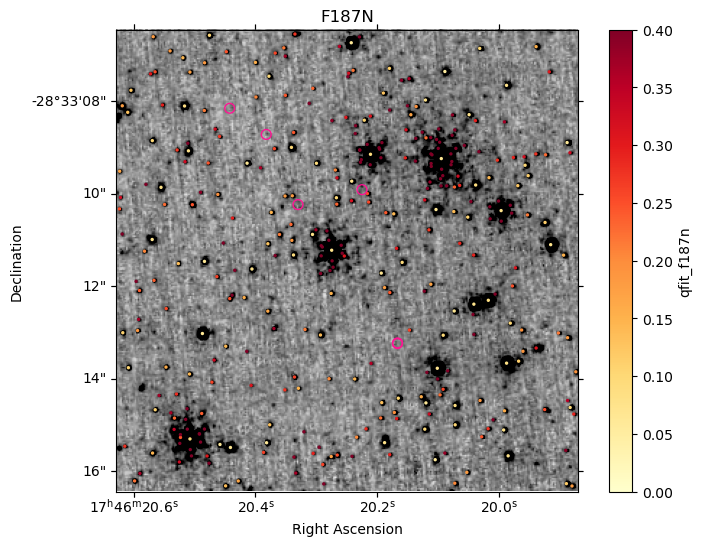

In [50]:
plt.figure(figsize=(8,6))

ax1 = plt.subplot(111, projection=cutout_187.wcs)
ax1.imshow(cutout_187.data, vmin=0, vmax=25, cmap='Greys')
#ax1.scatter(crds_in_405.ra, crds_in_405.dec, edgecolor='lime', facecolor='none', transform=ax1.get_transform('world'), s=2, label='405')
#ax1.scatter(crds_in_410.ra, crds_in_410.dec, edgecolor='cyan', facecolor='none', transform=ax1.get_transform('world'), s=2, label='410')
#ax1.scatter(crds_in_466.ra, crds_in_466.dec, edgecolor='red', facecolor='none', transform=ax1.get_transform('world'), s=2, label='466')
#ax1.scatter(crds_in_187.ra, crds_in_187.dec, edgecolor='cyan', facecolor='none', transform=ax1.get_transform('world'), s=2, label='187')
#ax1.scatter(crds_in_182.ra, crds_in_182.dec, edgecolor='cyan', facecolor='none', transform=ax1.get_transform('world'), s=2, label='182')
#ax1.scatter(crds_in_212.ra, crds_in_212.dec, edgecolor='red', facecolor='none', transform=ax1.get_transform('world'), s=2, label='212')
im=ax1.scatter(crds_in_187.ra, crds_in_187.dec, c=cat_in_187['qfit'], cmap='YlOrRd', transform=ax1.get_transform('world'), s=2, label='187', vmin=0, vmax=0.4)
ax1.scatter(dao_crds_in.ra, dao_crds_in.dec, edgecolor='deeppink', facecolor='none', transform=ax1.get_transform('world'), marker='o', s=50)

ax1.set_title('F187N')
ax1.set_xlabel('Right Ascension')
ax1.set_ylabel('Declination')
cbar = fig.colorbar(im)
cbar.ax.set_ylabel('qfit_f187n', rotation=90)
#ax1.legend(bbox_to_anchor=(1.1, 1.05))


# Merge Catalogs

Assuming the problem originates where the catalogs are merged, not elsewhere.

In [24]:
#baset = cat_in_405.copy()

In [25]:
#reffiltercol = [ref_filter] * len(baset)

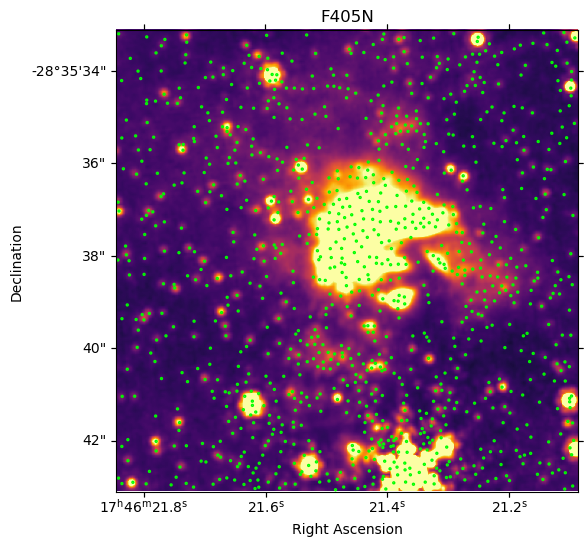

In [128]:
plt.figure(figsize=(6,6))

ax1 = plt.subplot(111, projection=cutout_405.wcs)
ax1.imshow(cutout_405.data, vmin=0, vmax=50, cmap='inferno')
ax1.scatter(basecrds.ra, basecrds.dec, edgecolor='lime', facecolor='none', transform=ax1.get_transform('world'), s=2, label='405')
#ax1.scatter(crds_in_410.ra, crds_in_410.dec, edgecolor='cyan', facecolor='none', transform=ax1.get_transform('world'), s=2, label='410')
#ax1.scatter(crds_in_466.ra, crds_in_466.dec, edgecolor='red', facecolor='none', transform=ax1.get_transform('world'), s=2, label='466')
#ax1.scatter(crds_in_187.ra, crds_in_187.dec, edgecolor='lime', facecolor='none', transform=ax1.get_transform('world'), s=2, label='187')
#ax1.scatter(crds_in_182.ra, crds_in_182.dec, edgecolor='cyan', facecolor='none', transform=ax1.get_transform('world'), s=2, label='182')
#ax1.scatter(crds_in_212.ra, crds_in_212.dec, edgecolor='red', facecolor='none', transform=ax1.get_transform('world'), s=2, label='212')

ax1.set_title('F405N')
ax1.set_xlabel('Right Ascension')
ax1.set_ylabel('Declination')
#ax1.legend(bbox_to_anchor=(1.1, 1.05))


In [20]:
tablename = '/orange/adamginsburg/jwst/cloudc/catalogs/test'

In [21]:
basetable_o = baset = Table.read(f"{tablename}.fits")

In [22]:
np.sum(basetable_o['near_saturated_f410m_f410m'])

10

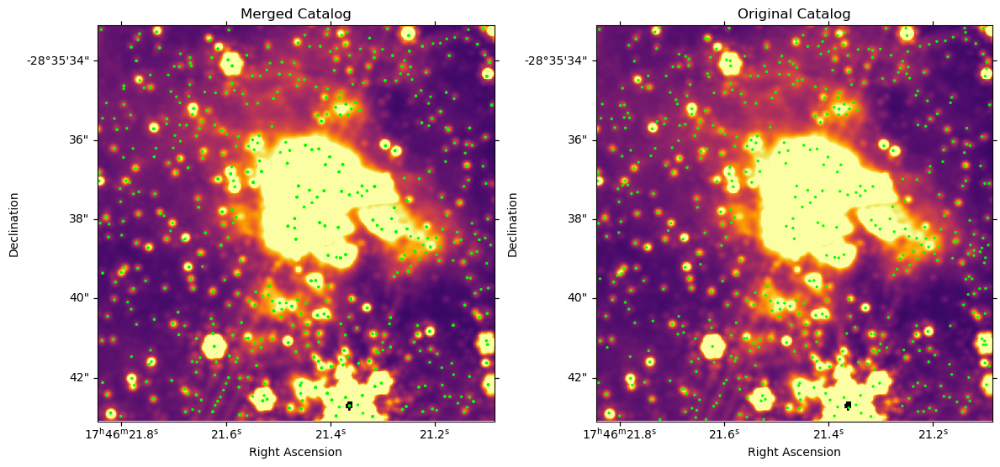

In [23]:
fig = plt.figure(figsize=(12, 6))

ax1 = plt.subplot(121, projection=cutout_410.wcs)
ax1.imshow(cutout_410.data, vmin=0, vmax=25, cmap='inferno')
ax1.scatter(basetable_o['skycoord_f410m'].ra, basetable_o['skycoord_f410m'].dec, edgecolor='lime', facecolor='none', transform=ax1.get_transform('world'), s=2)
ax1.set_title('Merged Catalog')
ax1.set_xlabel('Right Ascension')
ax1.set_ylabel('Declination')

ax2 = plt.subplot(122, projection=cutout_410.wcs)
ax2.imshow(cutout_410.data, vmin=0, vmax=25, cmap='inferno')
ax2.scatter(crds_in_410.ra, crds_in_410.dec, edgecolor='lime', facecolor='none', transform=ax2.get_transform('world'), s=2)
ax2.set_title('Original Catalog')
ax2.set_xlabel('Right Ascension')
ax2.set_ylabel('Declination')

plt.tight_layout()
plt.show()

In [37]:
crds = basetable['skycoord_ref']
base_in = basetable[reg_cloudc.contains(crds, wcs=cutout_410.wcs)]
crds_in = crds[reg_cloudc.contains(crds, wcs=cutout_410.wcs)]

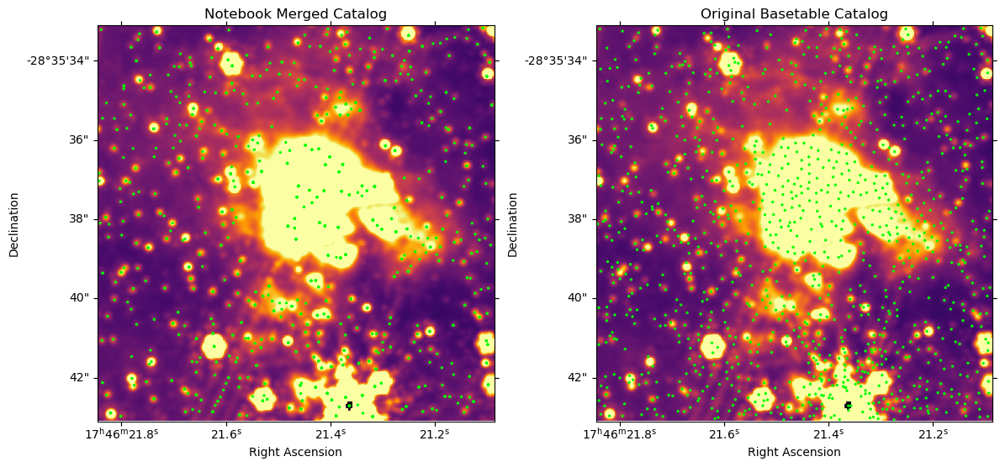

In [32]:
fig = plt.figure(figsize=(12, 6))

ax1 = plt.subplot(121, projection=cutout_410.wcs)
ax1.imshow(cutout_410.data, vmin=0, vmax=25, cmap='inferno')
ax1.scatter(basetable_o['skycoord_f410m'].ra, basetable_o['skycoord_f410m'].dec, edgecolor='lime', facecolor='none', transform=ax1.get_transform('world'), s=2)
ax1.set_title('Notebook Merged Catalog')
ax1.set_xlabel('Right Ascension')
ax1.set_ylabel('Declination')

ax2 = plt.subplot(122, projection=cutout_410.wcs)
ax2.imshow(cutout_410.data, vmin=0, vmax=25, cmap='inferno')
ax2.scatter(crds_in.ra, crds_in.dec, edgecolor='lime', facecolor='none', transform=ax2.get_transform('world'), s=2)
ax2.set_title('Original Basetable Catalog')
ax2.set_xlabel('Right Ascension')
ax2.set_ylabel('Declination')

plt.tight_layout()
plt.show()

In [38]:
neat_in = basetable_o[reg_cloudc.contains(basetable_o['skycoord_ref'], wcs=cutout_410.wcs)]
near_sat = neat_in['near_saturated_f410m_f410m']#np.logical_or(base_in['near_saturated_f410m_f410m'], base_in['near_saturated_f405n_f405n'])
b_crds_in = basetable_o['skycoord_ref'][reg_cloudc.contains(basetable_o['skycoord_ref'], wcs=cutout_410.wcs)]
#
sat_in = base_in['near_saturated_f410m_f410m'] == True

In [27]:
np.sum(basetable['near_saturated_f410m_f410m'])

3052

In [28]:
len(basetable)

886238

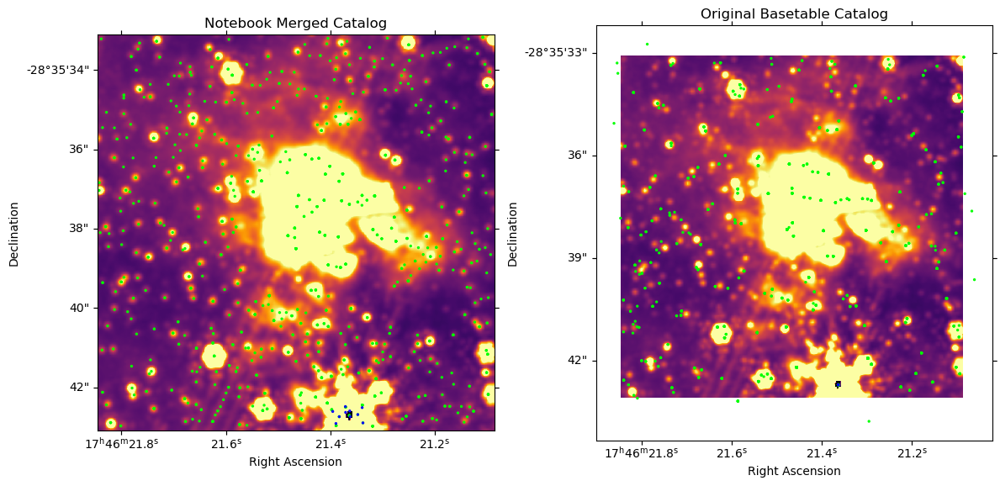

In [42]:
fig = plt.figure(figsize=(12, 6))

ax1 = plt.subplot(121, projection=cutout_410.wcs)
ax1.imshow(cutout_410.data, vmin=0, vmax=25, cmap='inferno')
ax1.scatter(basetable_o['skycoord_f410m'].ra, basetable_o['skycoord_f410m'].dec, edgecolor='lime', facecolor='none', transform=ax1.get_transform('world'), s=2)
ax1.scatter(b_crds_in[near_sat].ra, b_crds_in[near_sat].dec, edgecolor='blue', facecolor='none', transform=ax1.get_transform('world'), s=2)
ax1.set_title('Notebook Merged Catalog')
ax1.set_xlabel('Right Ascension')
ax1.set_ylabel('Declination')

ax2 = plt.subplot(122, projection=cutout_410.wcs)
ax2.imshow(cutout_410.data, vmin=0, vmax=25, cmap='inferno')
ax2.scatter(base_in['skycoord_f410m'].ra, base_in['skycoord_f410m'].dec, edgecolor='lime', facecolor='none', transform=ax2.get_transform('world'), s=2)
ax2.scatter(base_in['skycoord_f410m'][sat_in].ra, base_in['skycoord_f410m'][sat_in].dec, edgecolor='blue', facecolor='none', transform=ax2.get_transform('world'), s=2)
ax2.set_title('Original Basetable Catalog')
ax2.set_xlabel('Right Ascension')
ax2.set_ylabel('Declination')

plt.tight_layout()
plt.show()

In [ ]:
print(

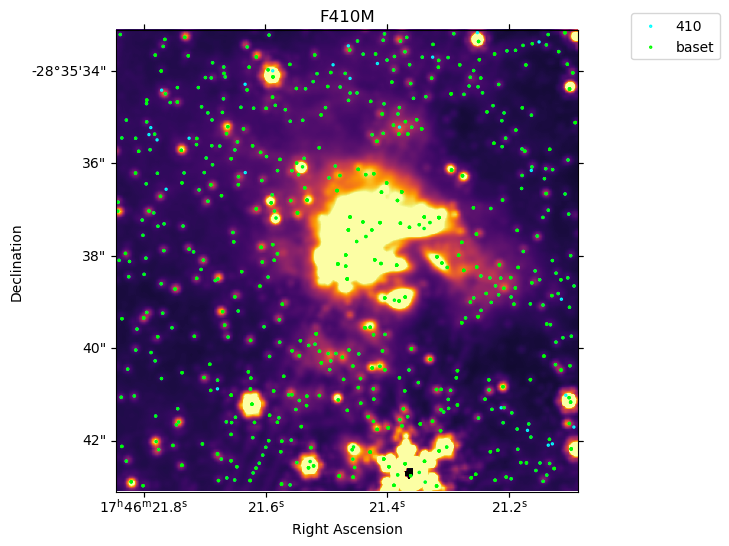

In [34]:
plt.figure(figsize=(6,6))

ax1 = plt.subplot(111, projection=cutout_410.wcs)
ax1.imshow(cutout_410.data, vmin=0, vmax=50, cmap='inferno')
ax1.scatter(crds_in_410.ra, crds_in_410.dec, edgecolor='cyan', facecolor='none', transform=ax1.get_transform('world'), s=2, label='410')
ax1.scatter(basetable_o['skycoord_f410m'].ra, basetable_o['skycoord_f410m'].dec, edgecolor='lime', facecolor='none', transform=ax1.get_transform('world'), s=2, label='baset')
#ax1.scatter(crds_in_466.ra, crds_in_466.dec, edgecolor='red', facecolor='none', transform=ax1.get_transform('world'), s=2, label='466')
#ax1.scatter(crds_in_187.ra, crds_in_187.dec, edgecolor='lime', facecolor='none', transform=ax1.get_transform('world'), s=2, label='187')
#ax1.scatter(crds_in_182.ra, crds_in_182.dec, edgecolor='cyan', facecolor='none', transform=ax1.get_transform('world'), s=2, label='182')
#ax1.scatter(crds_in_212.ra, crds_in_212.dec, edgecolor='red', facecolor='none', transform=ax1.get_transform('world'), s=2, label='212')

ax1.set_title('F410M')
ax1.set_xlabel('Right Ascension')
ax1.set_ylabel('Declination')
ax1.legend(bbox_to_anchor=(1.1, 1.05))


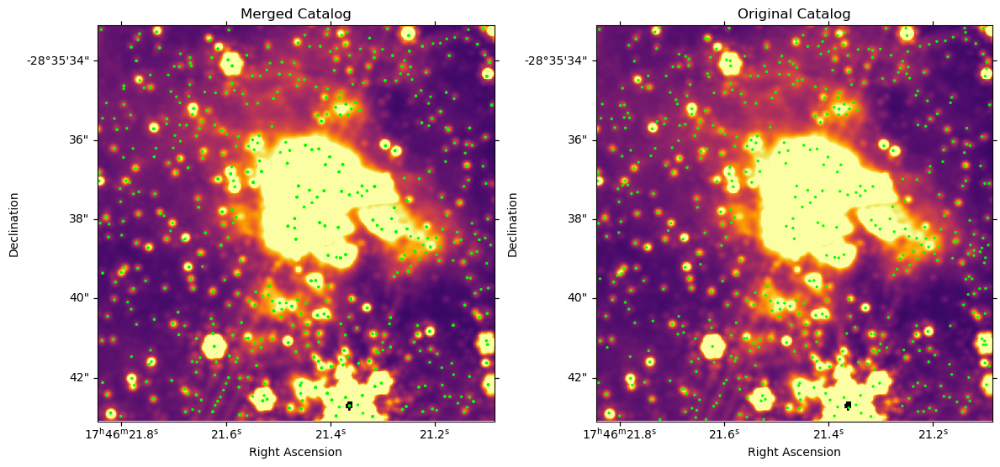

In [33]:
fig = plt.figure(figsize=(12, 6))

ax1 = plt.subplot(121, projection=cutout_410.wcs)
ax1.imshow(cutout_410.data, vmin=0, vmax=25, cmap='inferno')
ax1.scatter(basetable_o['skycoord_f410m'].ra, basetable_o['skycoord_f410m'].dec, edgecolor='lime', facecolor='none', transform=ax1.get_transform('world'), s=2)
ax1.set_title('Merged Catalog')
ax1.set_xlabel('Right Ascension')
ax1.set_ylabel('Declination')

ax2 = plt.subplot(122, projection=cutout_410.wcs)
ax2.imshow(cutout_410.data, vmin=0, vmax=25, cmap='inferno')
ax2.scatter(crds_in_410.ra, crds_in_410.dec, edgecolor='lime', facecolor='none', transform=ax2.get_transform('world'), s=2)
ax2.set_title('Original Catalog')
ax2.set_xlabel('Right Ascension')
ax2.set_ylabel('Declination')

plt.tight_layout()
plt.show()

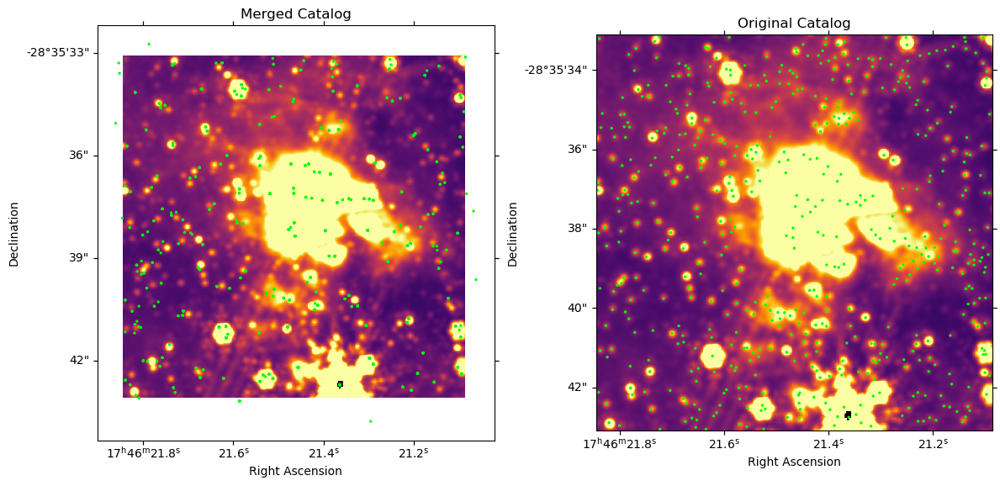

In [35]:
fig = plt.figure(figsize=(12, 6))

ax1 = plt.subplot(121, projection=cutout_410.wcs)
ax1.imshow(cutout_410.data, vmin=0, vmax=25, cmap='inferno')
ax1.scatter(base_in['skycoord_f410m'].ra, base_in['skycoord_f410m'].dec, edgecolor='lime', facecolor='none', transform=ax1.get_transform('world'), s=2)
ax1.set_title('Merged Catalog')
ax1.set_xlabel('Right Ascension')
ax1.set_ylabel('Declination')

ax2 = plt.subplot(122, projection=cutout_410.wcs)
ax2.imshow(cutout_410.data, vmin=0, vmax=25, cmap='inferno')
ax2.scatter(crds_in_410.ra, crds_in_410.dec, edgecolor='lime', facecolor='none', transform=ax2.get_transform('world'), s=2)
ax2.set_title('Original Catalog')
ax2.set_xlabel('Right Ascension')
ax2.set_ylabel('Declination')

plt.tight_layout()
plt.show()

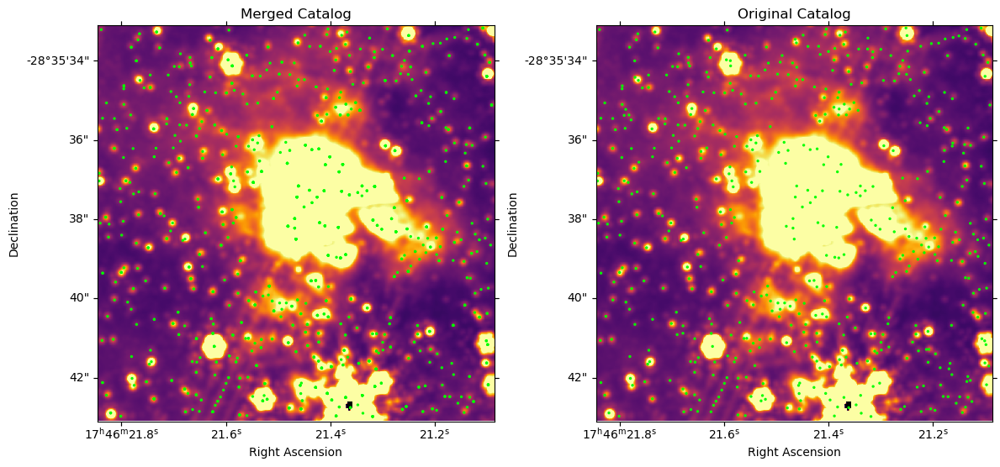

In [35]:
fig = plt.figure(figsize=(12, 6))

ax1 = plt.subplot(121, projection=cutout_410.wcs)
ax1.imshow(cutout_410.data, vmin=0, vmax=25, cmap='inferno')
ax1.scatter(basetable_o['skycoord_f410m'].ra, basetable_o['skycoord_f410m'].dec, edgecolor='lime', facecolor='none', transform=ax1.get_transform('world'), s=2)
ax1.set_title('Merged Catalog')
ax1.set_xlabel('Right Ascension')
ax1.set_ylabel('Declination')

ax2 = plt.subplot(122, projection=cutout_410.wcs)
ax2.imshow(cutout_410.data, vmin=0, vmax=25, cmap='inferno')
ax2.scatter(crds_in_410.ra, crds_in_410.dec, edgecolor='lime', facecolor='none', transform=ax2.get_transform('world'), s=2)
ax2.set_title('Original Catalog')
ax2.set_xlabel('Right Ascension')
ax2.set_ylabel('Declination')

plt.tight_layout()
plt.show()

In [36]:
b_405 = baset[baset['skycoord_ref_filtername']=='f405n']['skycoord_ref']
b_410 = baset[baset['skycoord_ref_filtername']=='f410m']['skycoord_ref']
b_466 = baset[baset['skycoord_ref_filtername']=='f466n']['skycoord_ref']
b_187 = baset[baset['skycoord_ref_filtername']=='f187n']['skycoord_ref']
b_182 = baset[baset['skycoord_ref_filtername']=='f182m']['skycoord_ref']
b_212 = baset[baset['skycoord_ref_filtername']=='f212n']['skycoord_ref']

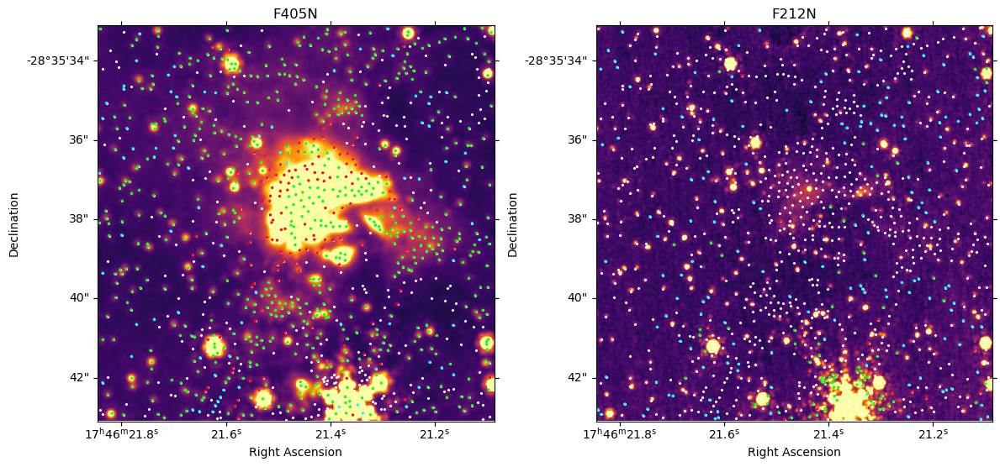

In [37]:
plt.figure(figsize=(12,6))

ax1 = plt.subplot(121, projection=cutout_405.wcs)
ax1.imshow(cutout_405.data, vmin=0, vmax=50, cmap='inferno')
ax1.scatter(baset['skycoord_ref'].ra, baset['skycoord_ref'].dec, color='white', transform=ax1.get_transform('world'), marker='x', s=2)
ax1.scatter(b_405.ra, b_405.dec, edgecolor='lime', facecolor='none', transform=ax1.get_transform('world'), s=2, label='405')
ax1.scatter(b_410.ra, b_410.dec, edgecolor='cyan', facecolor='none', transform=ax1.get_transform('world'), s=2, label='410')
ax1.scatter(b_466.ra, b_466.dec, edgecolor='red', facecolor='none', transform=ax1.get_transform('world'), s=2, label='466')
ax1.set_title('F405N')
ax1.set_xlabel('Right Ascension')
ax1.set_ylabel('Declination')
#ax1.legend(bbox_to_anchor=(1.1, 1.05))

ax2 = plt.subplot(122, projection=cutout_212.wcs)
ax2.imshow(cutout_212.data, vmin=0, vmax=50, cmap='inferno')
ax2.scatter(baset['skycoord_ref'].ra, baset['skycoord_ref'].dec, color='white', transform=ax2.get_transform('world'), marker='x', s=2)
ax2.scatter(b_187.ra, b_187.dec, edgecolor='lime', facecolor='none', transform=ax2.get_transform('world'), s=2, label='187')
ax2.scatter(b_182.ra, b_182.dec, edgecolor='cyan', facecolor='none', transform=ax2.get_transform('world'), s=2, label='182')
ax2.scatter(b_212.ra, b_212.dec, edgecolor='red', facecolor='none', transform=ax2.get_transform('world'), s=2, label='212')
ax2.set_title('F212N')
ax2.set_xlabel('Right Ascension')
ax2.set_ylabel('Declination')

plt.tight_layout()
plt.show()

# Notebook Merged

In [59]:
cat_405.meta['filter'] = 'f405n'
cat_410.meta['filter'] = 'f410m'
cat_466.meta['filter'] = 'f466n'
cat_187.meta['filter'] = 'f187n'
cat_182.meta['filter'] = 'f182m'
cat_212.meta['filter'] = 'f212n'

In [60]:
tbls = [cat_405, cat_410, cat_466, 
        cat_187, cat_182, cat_212]

In [61]:
jfilts = SvoFps.get_filter_list('JWST')
jfilts.add_index('filterID')

In [62]:
fn_405 = f'{basepath}/images/jw02221-o002_t001_nircam_clear-f405n-merged_i2d.fits'
fn_410 = f'{basepath}/images/jw02221-o002_t001_nircam_clear-f410m-merged_i2d.fits'
fn_466 = f'{basepath}/images/jw02221-o002_t001_nircam_clear-f466n-merged_i2d.fits'
fn_187 = f'{basepath}/images/jw02221-o002_t001_nircam_clear-f187n-merged_i2d.fits'
fn_182 = f'{basepath}/images/jw02221-o002_t001_nircam_clear-f182m-merged_i2d.fits'
fn_212 = f'{basepath}/images/jw02221-o002_t001_nircam_clear-f212n-merged_i2d.fits'

In [63]:
# wcs.WCS(fits.getheader(fn, ext=('SCI', 1))
wcs_405 = WCS(fits.getheader(fn_405, ext=('SCI', 1)))
wcs_410 = WCS(fits.getheader(fn_410, ext=('SCI', 1)))
wcs_466 = WCS(fits.getheader(fn_466, ext=('SCI', 1)))
wcs_187 = WCS(fits.getheader(fn_187, ext=('SCI', 1)))
wcs_182 = WCS(fits.getheader(fn_182, ext=('SCI', 1)))
wcs_212 = WCS(fits.getheader(fn_212, ext=('SCI', 1)))

In [64]:
wcses = [wcs_405, wcs_410, wcs_466, 
         wcs_187, wcs_182, wcs_212]

In [65]:
for tbl, ww in zip(tbls, wcses):

    tbl.meta['pixelscale_deg2'] = ww.proj_plane_pixel_area()
    tbl.meta['pixelscale_arcsec'] = (ww.proj_plane_pixel_area()**0.5).to(u.arcsec)

    flux_jy = (tbl['flux'] * u.MJy/u.sr * (2*np.pi / (8*np.log(2))) * tbl['fwhm']**2 * tbl.meta['pixelscale_deg2']).to(u.Jy)
    eflux_jy = (tbl['dflux'] * u.MJy/u.sr * (2*np.pi / (8*np.log(2))) * tbl['fwhm']**2 * tbl.meta['pixelscale_deg2']).to(u.Jy)

    filtername = tbl.meta["filter"]
    zeropoint = u.Quantity(jfilts.loc[f'JWST/NIRCam.{filtername.upper()}']['ZeroPoint'], u.Jy)
    abmag = -2.5 * np.log10(flux_jy / zeropoint)
    abmag_err = 2.5 / np.log(10) * np.abs(eflux_jy / flux_jy)
    tbl.add_column(flux_jy, name='flux_jy')
    tbl.add_column(eflux_jy, name='eflux_jy')
    tbl.add_column(abmag, name='mag_ab')
    tbl.add_column(abmag_err, name='emag_ab')

/blue/adamginsburg/adamginsburg/repos/astropy/astropy/units/quantity.py:666: RuntimeWarning: invalid value encountered in log10
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)
/blue/adamginsburg/adamginsburg/repos/astropy/astropy/units/quantity.py:666: RuntimeWarning: invalid value encountered in log10
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)
/blue/adamginsburg/adamginsburg/repos/astropy/astropy/units/quantity.py:666: RuntimeWarning: invalid value encountered in log10
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)
/blue/adamginsburg/adamginsburg/repos/astropy/astropy/units/quantity.py:666: RuntimeWarning: invalid value encountered in log10
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)
/blue/adamginsburg/adamginsburg/repos/astropy/astropy/units/quantity.py:666: RuntimeWarning: invalid value encountered in log10
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


In [66]:
ref_filter = 'f405n'
max_offset=0.15*u.arcsec
target='cloudc'
basepath='/orange/adamginsburg/jwst/cloudc/'

In [67]:
basetable = [tb for tb in tbls if tb.meta['filter'] == ref_filter][0].copy()

In [68]:
reffiltercol = [ref_filter] * len(basetable)

In [69]:
basecrds = basetable['skycoord']
for tb in tbls:
    if tb.meta['filter'] == ref_filter:
        continue
    crds = tb['skycoord']
    matches, sep, _ = crds.match_to_catalog_sky(basecrds, nthneighbor=1)
    newcrds = crds[sep > max_offset]
    basecrds = SkyCoord([basecrds, newcrds])
    reffiltercol += [tb.meta['filter']] * len(newcrds)
    print(f"Added {len(newcrds)} new sources in filter {tb.meta['filter']}")
print(f"Base coordinate length = {len(basecrds)}")

Added 63106 new sources in filter f410m
Added 49232 new sources in filter f466n
Added 83113 new sources in filter f187n
Added 156418 new sources in filter f182m
Added 21877 new sources in filter f212n
Base coordinate length = 870254


In [72]:
#crds = basecrds#basetable['skycoord_ref']
basecrds_in = basecrds[reg_cloudc.contains(basecrds, wcs=cutout_410.wcs)]

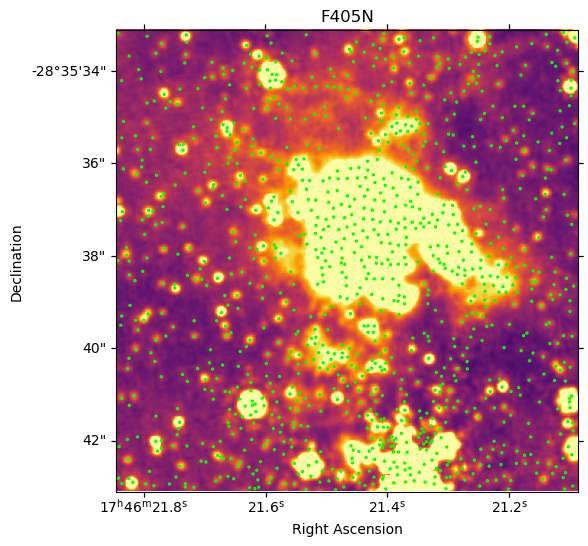

In [74]:
basecrds_in = basecrds[reg_cloudc.contains(basecrds, wcs=cutout_410.wcs)]
plt.figure(figsize=(6,6))

ax1 = plt.subplot(111, projection=cutout_405.wcs)
ax1.imshow(cutout_405.data, vmin=0, vmax=25, cmap='inferno')
ax1.scatter(basecrds_in.ra, basecrds_in.dec, edgecolor='lime', facecolor='none', transform=ax1.get_transform('world'), s=2, label='405')
#ax1.scatter(crds_in_410.ra, crds_in_410.dec, edgecolor='cyan', facecolor='none', transform=ax1.get_transform('world'), s=2, label='410')
#ax1.scatter(crds_in_466.ra, crds_in_466.dec, edgecolor='red', facecolor='none', transform=ax1.get_transform('world'), s=2, label='466')
#ax1.scatter(crds_in_187.ra, crds_in_187.dec, edgecolor='lime', facecolor='none', transform=ax1.get_transform('world'), s=2, label='187')
#ax1.scatter(crds_in_182.ra, crds_in_182.dec, edgecolor='cyan', facecolor='none', transform=ax1.get_transform('world'), s=2, label='182')
#ax1.scatter(crds_in_212.ra, crds_in_212.dec, edgecolor='red', facecolor='none', transform=ax1.get_transform('world'), s=2, label='212')

ax1.set_title('F405N')
ax1.set_xlabel('Right Ascension')
ax1.set_ylabel('Declination')
#ax1.legend(bbox_to_anchor=(1.1, 1.05))


In [76]:
from merge_catalogs import flag_near_saturated, replace_saturated

In [77]:
basetable = Table()
basetable['skycoord_ref'] = basecrds
basetable['skycoord_ref_filtername'] = reffiltercol
meta = {}

with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    for tbl in tbls:
        t0 = time.time()
        wl = tbl.meta['filter']
        print(wl)
        flag_near_saturated(tbl, filtername=wl, target=target, basepath=basepath)
        replace_saturated(tbl, filtername=wl, target=target, basepath=basepath)

        crds = tbl['skycoord']
        matches, sep, _ = basecrds.match_to_catalog_sky(crds, nthneighbor=1)
        print(f"filter {wl} has {len(tbl)} rows.  Matching took {time.time()-t0:0.1f} seconds")

        basetable.add_column(name=f"sep_{wl}", col=sep)
        basetable.add_column(name=f"id_{wl}", col=matches)
        matchtb = tbl[matches]
        badsep = sep > max_offset
        for cn in matchtb.colnames:
            if isinstance(matchtb[cn], SkyCoord):
                matchtb.rename_column(cn, f"{cn}_{wl}")
                matchtb[f'mask_{wl}'] = badsep
            else:
                matchtb[f'{cn}_{wl}'] = MaskedColumn(data=matchtb[cn], name=f'{cn}_{wl}')
                matchtb[f'{cn}_{wl}'].mask[badsep] = True
                if hasattr(matchtb[cn], 'meta'):
                    matchtb[f'{cn}_{wl}'].meta = matchtb[cn].meta
                matchtb.remove_column(cn)

        basetable = table.hstack([basetable, matchtb], join_type='exact')

f405n
Replacing 125 stars that are saturated of 496600 in filter f405n.  92 are newly added.  The total replaced stars=217
Catalog did not have flux_fit.  colnames=['x', 'y', 'flux', 'passno', 'dx', 'dy', 'dflux', 'qf', 'rchi2', 'fracflux', 'fluxlbs', 'dfluxlbs', 'fwhm', 'spread_model', 'dspread_model', 'fluxiso', 'xiso', 'yiso', 'flags', 'sky', 'skycoord', 'flux_jy', 'eflux_jy', 'mag_ab', 'emag_ab', 'near_saturated_f405n', 'replaced_saturated']
filter f405n has 496600 rows.  Matching took 7.9 seconds
f410m
Replacing 898 stars that are saturated of 466895 in filter f410m.  539 are newly added.  The total replaced stars=1436
Catalog did not have flux_fit.  colnames=['x', 'y', 'flux', 'passno', 'dx', 'dy', 'dflux', 'qf', 'rchi2', 'fracflux', 'fluxlbs', 'dfluxlbs', 'fwhm', 'spread_model', 'dspread_model', 'fluxiso', 'xiso', 'yiso', 'flags', 'sky', 'skycoord', 'flux_jy', 'eflux_jy', 'mag_ab', 'emag_ab', 'near_saturated_f410m', 'replaced_saturated']
filter f410m has 466895 rows.  Matching t

In [82]:
np.sum(basetable['near_saturated_f410m_f410m'])

13006

In [83]:
for colname in basetable.colnames:    # Adding to try to fix FITS file turning "masked" into True
    try:  
        if basetable[colname].dtype.name == 'bool':
            basetable[colname][basetable[colname].mask] = False
    except:
        print('no dtype')

no dtype
no dtype
no dtype
no dtype
no dtype
no dtype
no dtype
no dtype
no dtype
no dtype
no dtype
no dtype
no dtype


In [84]:
np.sum(basetable['near_saturated_f410m_f410m'])

13006

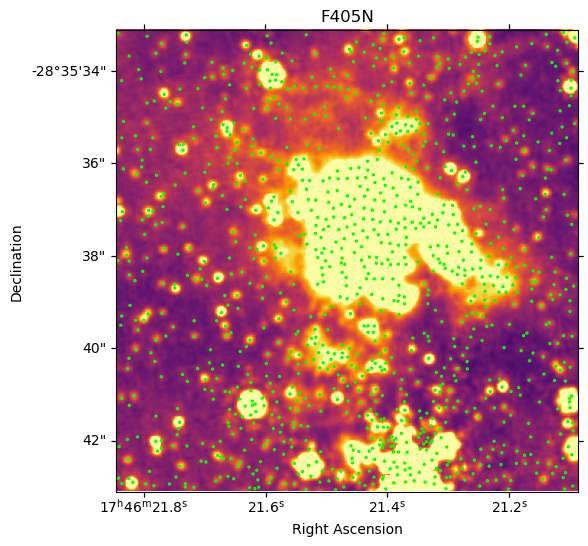

In [90]:
basecrds_in = basetable['skycoord_ref'][reg_cloudc.contains(basetable['skycoord_ref'], wcs=cutout_410.wcs)]
plt.figure(figsize=(6,6))

ax1 = plt.subplot(111, projection=cutout_405.wcs)
ax1.imshow(cutout_405.data, vmin=0, vmax=25, cmap='inferno')
ax1.scatter(basecrds_in.ra, basecrds_in.dec, edgecolor='lime', facecolor='none', transform=ax1.get_transform('world'), s=2, label='405')
#ax1.scatter(crds_in_410.ra, crds_in_410.dec, edgecolor='cyan', facecolor='none', transform=ax1.get_transform('world'), s=2, label='410')
#ax1.scatter(crds_in_466.ra, crds_in_466.dec, edgecolor='red', facecolor='none', transform=ax1.get_transform('world'), s=2, label='466')
#ax1.scatter(crds_in_187.ra, crds_in_187.dec, edgecolor='lime', facecolor='none', transform=ax1.get_transform('world'), s=2, label='187')
#ax1.scatter(crds_in_182.ra, crds_in_182.dec, edgecolor='cyan', facecolor='none', transform=ax1.get_transform('world'), s=2, label='182')
#ax1.scatter(crds_in_212.ra, crds_in_212.dec, edgecolor='red', facecolor='none', transform=ax1.get_transform('world'), s=2, label='212')

ax1.set_title('F405N')
ax1.set_xlabel('Right Ascension')
ax1.set_ylabel('Declination')
#ax1.legend(bbox_to_anchor=(1.1, 1.05))


In [85]:
tablename = '/orange/adamginsburg/jwst/cloudc/catalogs/test_notebook'

In [87]:
#basetable.write(f"{tablename}.fits", overwrite=True) #/orange/adamginsburg/jwst/cloudc/catalogs/test_notebook.fits

In [88]:
basetable_p = Table.read(f"{tablename}.fits")

In [89]:
np.sum(basetable_p['near_saturated_f410m_f410m'])

13006

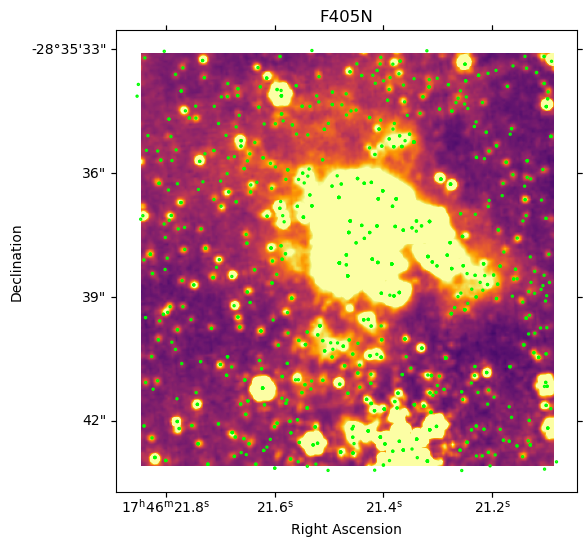

In [92]:
basecrds_in = basetable_p['skycoord_f410m'][reg_cloudc.contains(basetable_p['skycoord_ref'], wcs=cutout_410.wcs)]
plt.figure(figsize=(6,6))

ax1 = plt.subplot(111, projection=cutout_405.wcs)
ax1.imshow(cutout_405.data, vmin=0, vmax=25, cmap='inferno')
ax1.scatter(basecrds_in.ra, basecrds_in.dec, edgecolor='lime', facecolor='none', transform=ax1.get_transform('world'), s=2, label='405')
#ax1.scatter(crds_in_410.ra, crds_in_410.dec, edgecolor='cyan', facecolor='none', transform=ax1.get_transform('world'), s=2, label='410')
#ax1.scatter(crds_in_466.ra, crds_in_466.dec, edgecolor='red', facecolor='none', transform=ax1.get_transform('world'), s=2, label='466')
#ax1.scatter(crds_in_187.ra, crds_in_187.dec, edgecolor='lime', facecolor='none', transform=ax1.get_transform('world'), s=2, label='187')
#ax1.scatter(crds_in_182.ra, crds_in_182.dec, edgecolor='cyan', facecolor='none', transform=ax1.get_transform('world'), s=2, label='182')
#ax1.scatter(crds_in_212.ra, crds_in_212.dec, edgecolor='red', facecolor='none', transform=ax1.get_transform('world'), s=2, label='212')

ax1.set_title('F405N')
ax1.set_xlabel('Right Ascension')
ax1.set_ylabel('Declination')
#ax1.legend(bbox_to_anchor=(1.1, 1.05))


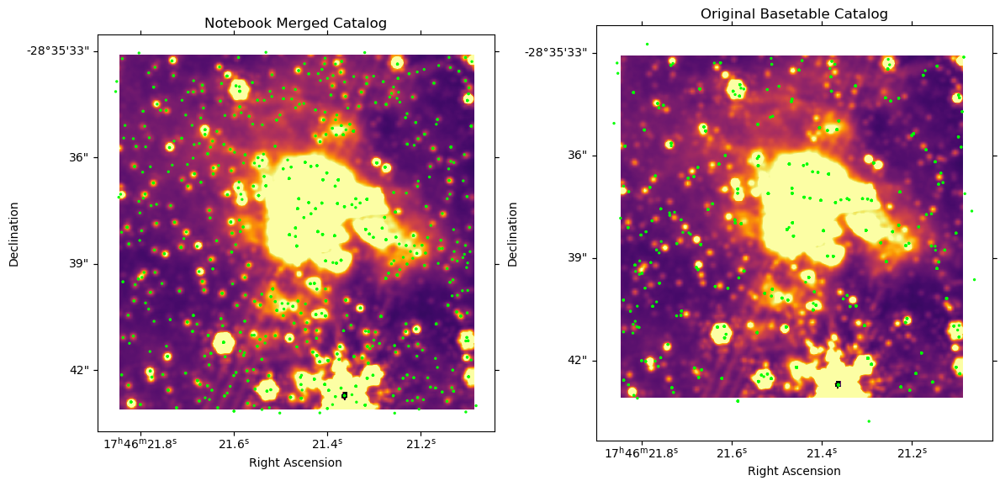

In [94]:
base_p_in = basetable_p[reg_cloudc.contains(basetable_p['skycoord_ref'], wcs=cutout_410.wcs)]
base_k_in = basetable_k[reg_cloudc.contains(basetable_k['skycoord_ref'], wcs=cutout_410.wcs)]
fig = plt.figure(figsize=(12, 6))

ax1 = plt.subplot(121, projection=cutout_410.wcs)
ax1.imshow(cutout_410.data, vmin=0, vmax=25, cmap='inferno')
ax1.scatter(base_p_in['skycoord_f410m'].ra, base_p_in['skycoord_f410m'].dec, edgecolor='lime', facecolor='none', transform=ax1.get_transform('world'), s=2)
#ax1.scatter(b_crds_in[near_sat].ra, b_crds_in[near_sat].dec, edgecolor='blue', facecolor='none', transform=ax1.get_transform('world'), s=2)
ax1.set_title('Notebook Merged Catalog')
ax1.set_xlabel('Right Ascension')
ax1.set_ylabel('Declination')

ax2 = plt.subplot(122, projection=cutout_410.wcs)
ax2.imshow(cutout_410.data, vmin=0, vmax=25, cmap='inferno')
ax2.scatter(base_k_in['skycoord_f410m'].ra, base_k_in['skycoord_f410m'].dec, edgecolor='lime', facecolor='none', transform=ax2.get_transform('world'), s=2)
#ax2.scatter(base_in['skycoord_f410m'][sat_in].ra, base_in['skycoord_f410m'][sat_in].dec, edgecolor='blue', facecolor='none', transform=ax2.get_transform('world'), s=2)
ax2.set_title('Original Basetable Catalog')
ax2.set_xlabel('Right Ascension')
ax2.set_ylabel('Declination')

plt.tight_layout()
plt.show()

# Testing Saturated Stars

In [94]:
from astroquery.svo_fps import SvoFps

In [95]:
jfilts = SvoFps.get_filter_list('JWST')
jfilts.add_index('filterID')

In [96]:
from merge_catalogs import flag_near_saturated, replace_saturated

In [102]:
catalog_test = tbl = cat_410.copy()
ww = cutout_410.wcs

tbl.meta['filter'] = 'f410m'

tbl.meta['pixelscale_deg2'] = ww.proj_plane_pixel_area()
tbl.meta['pixelscale_arcsec'] = (ww.proj_plane_pixel_area()**0.5).to(u.arcsec)

flux_jy = (tbl['flux'] * u.MJy/u.sr * (2*np.pi / (8*np.log(2))) * tbl['fwhm']**2 * tbl.meta['pixelscale_deg2']).to(u.Jy)
eflux_jy = (tbl['dflux'] * u.MJy/u.sr * (2*np.pi / (8*np.log(2))) * tbl['fwhm']**2 * tbl.meta['pixelscale_deg2']).to(u.Jy)

filtername = tbl.meta["filter"]
zeropoint = u.Quantity(jfilts.loc[f'JWST/NIRCam.{filtername.upper()}']['ZeroPoint'], u.Jy)
abmag = -2.5 * np.log10(flux_jy / zeropoint)
abmag_err = 2.5 / np.log(10) * np.abs(eflux_jy / flux_jy)
tbl.add_column(flux_jy, name='flux_jy')
tbl.add_column(eflux_jy, name='eflux_jy')
tbl.add_column(abmag, name='mag_ab')
tbl.add_column(abmag_err, name='emag_ab')

/blue/adamginsburg/adamginsburg/repos/astropy/astropy/units/quantity.py:666: RuntimeWarning: invalid value encountered in log10
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


In [103]:
flag_near_saturated(tbl, 'f410m', radius=None, target='cloudc',
                        basepath='/orange/adamginsburg/jwst/cloudc/')

In [52]:
#for colname in catalog_test.colnames:    # Adding to try to fix FITS file turning "masked" into True
#    try: 
#        if catalog_test[colname].dtype == 'bool':
#            catalog_test[colname][catalog_test[colname].mask] = False
#    except:
#        print('no dtype')

no dtype
no dtype


In [104]:
np.sum(tbl['near_saturated_f410m'])

9780

In [105]:
replace_saturated(tbl, 'f410m', radius=None, target='cloudc',
                      basepath='/orange/adamginsburg/jwst/cloudc/')

/blue/adamginsburg/adamginsburg/miniconda3/envs/python39savannah/lib/python3.9/site-packages/numpy/lib/function_base.py:5394: RuntimeWarning: invalid value encountered in cast
  values = array(values, copy=False, ndmin=arr.ndim, dtype=arr.dtype)


Replacing 898 stars that are saturated of 466895 in filter f410m.  539 are newly added.  The total replaced stars=1436
Catalog did not have flux_fit.  colnames=['x', 'y', 'flux', 'passno', 'dx', 'dy', 'dflux', 'qf', 'rchi2', 'fracflux', 'fluxlbs', 'dfluxlbs', 'fwhm', 'spread_model', 'dspread_model', 'fluxiso', 'xiso', 'yiso', 'flags', 'sky', 'skycoord', 'flux_jy', 'eflux_jy', 'mag_ab', 'emag_ab', 'near_saturated_f410m', 'replaced_saturated']


In [107]:
len(tbl)

466895

In [108]:
tbl_in = tbl[reg_cloudc.contains(tbl['skycoord'], wcs=cutout_410.wcs)]

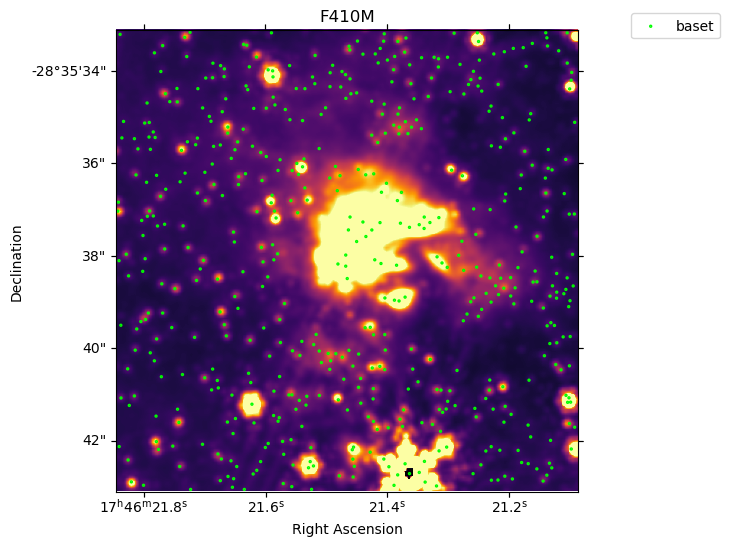

In [109]:
plt.figure(figsize=(6,6))

ax1 = plt.subplot(111, projection=cutout_410.wcs)
ax1.imshow(cutout_410.data, vmin=0, vmax=50, cmap='inferno')
ax1.scatter(tbl_in['skycoord'].ra, tbl_in['skycoord'].dec, edgecolor='lime', facecolor='none', transform=ax1.get_transform('world'), s=2, label='baset')

ax1.set_title('F410M')
ax1.set_xlabel('Right Ascension')
ax1.set_ylabel('Declination')
ax1.legend(bbox_to_anchor=(1.1, 1.05))


In [110]:
tablename = '/orange/adamginsburg/jwst/cloudc/catalogs/test'

In [106]:
np.sum(tbl['near_saturated_f410m'])

10319

In [111]:
tablename = '/orange/adamginsburg/jwst/cloudc/catalogs/test'
tbl.write(f"{tablename}.fits", overwrite=True)

In [112]:
tbl_o = Table.read(f"{tablename}.fits")

In [113]:
np.sum(tbl_o['near_saturated_f410m'])

10319

In [114]:
tbl_o_in = tbl_o[reg_cloudc.contains(tbl['skycoord'], wcs=cutout_410.wcs)]

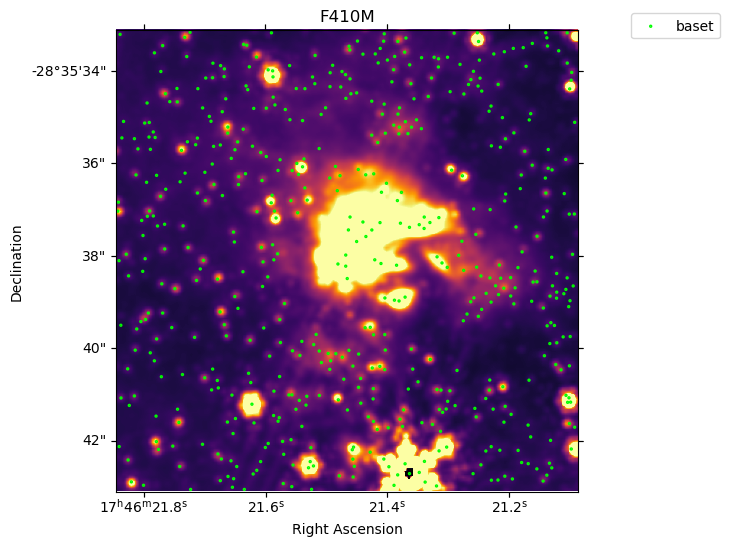

In [115]:
plt.figure(figsize=(6,6))

ax1 = plt.subplot(111, projection=cutout_410.wcs)
ax1.imshow(cutout_410.data, vmin=0, vmax=50, cmap='inferno')
ax1.scatter(tbl_o_in['skycoord'].ra, tbl_o_in['skycoord'].dec, edgecolor='lime', facecolor='none', transform=ax1.get_transform('world'), s=2, label='baset')

ax1.set_title('F410M')
ax1.set_xlabel('Right Ascension')
ax1.set_ylabel('Declination')
ax1.legend(bbox_to_anchor=(1.1, 1.05))


In [27]:
print(

SyntaxError: unexpected EOF while parsing (149104261.py, line 1)

# Testing pixel to world

In [ ]:
fn = '/orange/adamginsburg/jwst/cloudc/images/jw02221-o002_t001_nircam_clear-f405n-merged_i2d.fits'

In [ ]:
ww = WCS(fits.getheader(fn, ext=('SCI', 1)))

In [ ]:
xy = (4300.056197819368, 1061.838686852247)
pos = SkyCoord('17:46:21.6770855344', '-28:35:38.4730251001', unit=(u.hourangle, u.deg))

In [ ]:
crd = ww.pixel_to_world(xy[0], xy[1])

In [ ]:
pos.separation(crd)

In [ ]:
pos_to_pix = ww.world_to_pixel(pos)

In [ ]:
pos_to_pix

In [ ]:
np.sqrt((xy[0]-crd_to_pix[0])**2+(xy[1]-crd_to_pix[1])**2)

# Testing DAO Star Finder

In [11]:
from photutils.detection import DAOStarFinder, IRAFStarFinder
from photutils.psf import BasicPSFPhotometry as PSFPhotometry, IterativelySubtractedPSFPhotometry as IterativePSFPhotometry, DAOGroup as SourceGrouper
from photutils.background import MMMBackground, MADStdBackgroundRMS, MedianBackground, Background2D
from photutils.background import MMMBackground as LocalBackground

In [39]:
import photutils

In [40]:
photutils.background??

Type:        module
String form: <module 'photutils.background' from '/blue/adamginsburg/adamginsburg/miniconda3/envs/python39savannah/lib/python3.9/site-packages/photutils/background/__init__.py'>
File:        /blue/adamginsburg/adamginsburg/miniconda3/envs/python39savannah/lib/python3.9/site-packages/photutils/background/__init__.py
Source:     
# Licensed under a 3-clause BSD style license - see LICENSE.rst
"""
This subpackage contains tools to estimate the background and background
RMS in an image.
"""

from .background_2d import *  # noqa: F401, F403
from .core import *  # noqa: F401, F403
from .interpolators import *  # noqa: F401, F403

In [35]:
from photutils.background import LocalBackground

ImportError: cannot import name 'LocalBackground' from 'photutils.background' (/blue/adamginsburg/adamginsburg/miniconda3/envs/python39savannah/lib/python3.9/site-packages/photutils/background/__init__.py)

In [34]:
LocalBackground??

Init signature: LocalBackground(**kwargs)
Source:        
class MMMBackground(ModeEstimatorBackground):
    """
    Class to calculate the background in an array using the DAOPHOT MMM
    algorithm.

    The background is calculated using a mode estimator of the form
    ``(3 * median) - (2 * mean)``.

    Parameters
    ----------
    sigma_clip : `astropy.stats.SigmaClip` object, optional
        A `~astropy.stats.SigmaClip` object that defines the sigma
        clipping parameters.  If `None` then no sigma clipping will be
        performed.  The default is to perform sigma clipping with
        ``sigma=3.0`` and ``maxiters=5``.

    Examples
    --------
    >>> from astropy.stats import SigmaClip
    >>> from photutils.background import MMMBackground
    >>> data = np.arange(100)
    >>> sigma_clip = SigmaClip(sigma=3.0)
    >>> bkg = MMMBackground(sigma_clip=sigma_clip)

    The background value can be calculated by using the
    `~photutils.background.core.ModeEstimatorBackgroun

In [12]:
filtername='F410M'

In [13]:
basepath = '/orange/adamginsburg/jwst/cloudc/'
fwhm_tbl = Table.read(f'{basepath}/reduction/fwhm_table.ecsv')
row = fwhm_tbl[fwhm_tbl['Filter'] == filtername]
fwhm = fwhm_arcsec = float(row['PSF FWHM (arcsec)'][0])
fwhm_pix = float(row['PSF FWHM (pixel)'][0])

In [14]:
fn = '/orange/adamginsburg/jwst/cloudc/images/jw02221-o002_t001_nircam_clear-f410m-merged_i2d.fits'

In [15]:
h = fits.open(fn)
err = np.nanmedian(h['ERR'].data)

In [16]:
daofind_tuned = DAOStarFinder(threshold=3*err, # adjusting threshold from 5x median to 3x
                              fwhm=fwhm_pix, roundhi=1.0, roundlo=-1.0,
                              sharplo=0.30, sharphi=1.40)

In [25]:
finstars = daofind_tuned(np.nan_to_num(cutout_410.data))

In [26]:
finstars[:1]

id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak,flux,mag
int64,float64,float64,float64,float64,float64,int64,float64,float64,float64,float64
1,191.26765889299358,0.999595466469983,0.41369681301368155,-0.8641369250534634,-0.9351807017552853,25,0.0,111.1465831341612,93.25827897524232,-4.92421849138046


Text(0, 0.5, 'Declination')

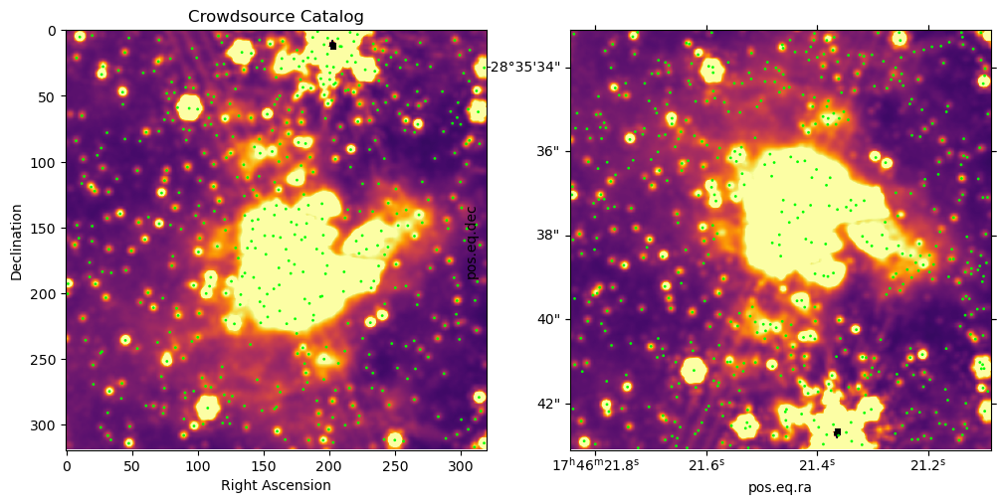

In [27]:
plt.figure(figsize=(12,6))

ax1 = plt.subplot(121)#, projection=cutout_405.wcs)
ax1.imshow(cutout_410.data, vmin=0, vmax=25, cmap='inferno')
ax1.scatter(finstars['xcentroid'], finstars['ycentroid'], edgecolor='lime', facecolor='none', s=1)
ax1.set_title('DAOStarFinder')
ax1.set_xlabel('Right Ascension')
ax1.set_ylabel('Declination')

ax2 = plt.subplot(122, projection=cutout_410.wcs)
ax2.imshow(cutout_410.data, vmin=0, vmax=25, cmap='inferno')
ax2.scatter(cat_in_410['skycoord'].ra, cat_in_410['skycoord'].dec, edgecolor='lime', facecolor='none', s=1, transform=ax2.get_transform('world'))
ax1.set_title('Crowdsource Catalog')
ax1.set_xlabel('Right Ascension')
ax1.set_ylabel('Declination')

In [32]:
phot = PSFPhotometry(finder=daofind_tuned,#finder_maker(),
                     #grouper=grouper,
                     #localbkg_estimator=None, # must be none or it un-saturates pixels
                     bkg_estimator=MMMBackground(),
                     #psf_model=dao_psf_model,
                     fitter=LevMarLSQFitter(),
                     fitshape=(5, 5),
                     aperture_radius=2*fwhm_pix,
                     #progress_bar=True,
                    )

TypeError: __init__() missing 2 required positional arguments: 'group_maker' and 'psf_model'

In [30]:
PSFPhotometry??

Init signature:
PSFPhotometry(
    group_maker,
    bkg_estimator,
    psf_model,
    fitshape,
    *,
    finder=None,
    fitter=<astropy.modeling.fitting.LevMarLSQFitter object at 0x1459d2672d00>,
    aperture_radius=None,
    extra_output_cols=None,
    subshape=None,
)
Source:        
class BasicPSFPhotometry:
    """
    This class implements a PSF photometry algorithm that can find
    sources in an image, group overlapping sources into a single model,
    fit the model to the sources, and subtracting the models from the
    image. This is roughly equivalent to the DAOPHOT routines FIND,
    GROUP, NSTAR, and SUBTRACT.  This implementation allows a flexible
    and customizable interface to perform photometry. For instance, one
    is able to use different implementations for grouping and finding
    sources by using ``group_maker`` and ``finder`` respectively. In
    addition, sky background estimation is performed by
    ``bkg_estimator``.

    Parameters
    ----------
    gr